In [5]:
#import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
sb.set()
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import os
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [6]:
from google.colab import files
uploaded = files.upload()

Saving data.csv to data (1).csv


In [7]:
#Loading the data
data = pd.read_csv('data.csv')

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11914 entries, 0 to 11913
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Make               11914 non-null  object 
 1   Model              11914 non-null  object 
 2   Year               11914 non-null  int64  
 3   Engine Fuel Type   11911 non-null  object 
 4   Engine HP          11845 non-null  float64
 5   Engine Cylinders   11884 non-null  float64
 6   Transmission Type  11914 non-null  object 
 7   Driven_Wheels      11914 non-null  object 
 8   Number of Doors    11908 non-null  float64
 9   Market Category    8172 non-null   object 
 10  Vehicle Size       11914 non-null  object 
 11  Vehicle Style      11914 non-null  object 
 12  highway MPG        11914 non-null  int64  
 13  city mpg           11914 non-null  int64  
 14  Popularity         11914 non-null  int64  
 15  MSRP               11914 non-null  int64  
dtypes: float64(3), int64(5

In [9]:
#retreiving first five rows
data.head()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,BMW,1 Series M,2011,premium unleaded (required),335.0,6.0,MANUAL,rear wheel drive,2.0,"Factory Tuner,Luxury,High-Performance",Compact,Coupe,26,19,3916,46135
1,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Convertible,28,19,3916,40650
2,BMW,1 Series,2011,premium unleaded (required),300.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,High-Performance",Compact,Coupe,28,20,3916,36350
3,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,18,3916,29450
4,BMW,1 Series,2011,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,Luxury,Compact,Convertible,28,18,3916,34500


In [10]:
#retreiving last 5 rows
data.tail()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
11909,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,46120
11910,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,56670
11911,Acura,ZDX,2012,premium unleaded (required),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50620
11912,Acura,ZDX,2013,premium unleaded (recommended),300.0,6.0,AUTOMATIC,all wheel drive,4.0,"Crossover,Hatchback,Luxury",Midsize,4dr Hatchback,23,16,204,50920
11913,Lincoln,Zephyr,2006,regular unleaded,221.0,6.0,AUTOMATIC,front wheel drive,4.0,Luxury,Midsize,Sedan,26,17,61,28995


In [11]:
#data statistics
data.describe()

,Year,Engine HP,Engine Cylinders,Number of Doors,highway MPG,city mpg,Popularity,MSRP
count,11914.000000,11845.00000,11884.000000,11908.000000,11914.000000,11914.000000,11914.000000,1.191400e+04
mean,2010.384338,249.38607,5.628829,3.436093,26.637485,19.733255,1554.911197,4.059474e+04
std,7.579740,109.19187,1.780559,0.881315,8.863001,8.987798,1441.855347,6.010910e+04
min,1990.000000,55.00000,0.000000,2.000000,12.000000,7.000000,2.000000,2.000000e+03
25%,2007.000000,170.00000,4.000000,2.000000,22.000000,16.000000,549.000000,2.100000e+04
50%,2015.000000,227.00000,6.000000,4.000000,26.000000,18.000000,1385.000000,2.999500e+04
75%,2016.000000,300.00000,6.000000,4.000000,30.000000,22.000000,2009.000000,4.223125e+04
max,2017.000000,1001.00000,16.000000,4.000000,354.000000,137.000000,5657.000000,2.065902e+06


In [12]:
data.isnull()

,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [13]:
data.isnull().sum()

Make                    0
Model                   0
Year                    0
Engine Fuel Type        3
Engine HP              69
Engine Cylinders       30
Transmission Type       0
Driven_Wheels           0
Number of Doors         6
Market Category      3742
Vehicle Size            0
Vehicle Style           0
highway MPG             0
city mpg                0
Popularity              0
MSRP                    0
dtype: int64

In [14]:
import pandas as pd

# Create a sample car_data DataFrame (replace this with your actual data loading or creation)
car_data = pd.DataFrame(data)

def remove_duplicate(data):
    # Display the first three duplicate rows
    print('\n Duplicate samples:\n')
    display(data[data.duplicated()][:3])

    # Drop duplicate rows and keep the first occurrence
    global car_data
    car_data = data.drop_duplicates(keep='first')
    print('\n Duplicate data have been removed from the dataset.')

# Example usage
remove_duplicate(car_data)



 Duplicate samples:



,Make,Model,Year,Engine Fuel Type,Engine HP,Engine Cylinders,Transmission Type,Driven_Wheels,Number of Doors,Market Category,Vehicle Size,Vehicle Style,highway MPG,city mpg,Popularity,MSRP
14,BMW,1 Series,2013,premium unleaded (required),230.0,6.0,MANUAL,rear wheel drive,2.0,"Luxury,Performance",Compact,Coupe,28,19,3916,31500
18,Audi,100,1992,regular unleaded,172.0,6.0,MANUAL,front wheel drive,4.0,Luxury,Midsize,Sedan,24,17,3105,2000
20,Audi,100,1992,regular unleaded,172.0,6.0,MANUAL,front wheel drive,4.0,Luxury,Midsize,Sedan,24,17,3105,2000



 Duplicate data have been removed from the dataset.


In [15]:
# Handling missing values in rows and columns
car_data[car_data['Number of Doors'].isna()]

# fill in researched result
car_data.loc[(car_data['Number of Doors'].isna()) & (car_data['Make'] == 'Ferrari'), 'Number of Doors'] = 3
car_data.loc[(car_data['Number of Doors'].isna())  & (car_data['Make'] == 'Tesla'), 'Number of Doors'] = 5


In [16]:
# missing value in engine-fuel type column
car_data[car_data['Engine Fuel Type'].isna()]

# fill in researched result
car_data.loc[(car_data['Engine Fuel Type'].isna())  & (car_data['Make'] == 'Suzuki'), 'Engine Fuel Type'] = 'Regular unleaded'


In [17]:
# missing value in engine cylinders column
nan_cylinder = car_data[car_data['Engine Cylinders'].isna()]
print('\n Distinct Make and Model with missing engine cylinders: \n')
display(list(nan_cylinder.groupby(['Make', 'Model']).groups.keys()))

# fill in researched result
car_data.loc[((car_data['Engine Cylinders'].isna())  & (car_data['Make'] == 'Mazda') & (car_data['Model'] == 'RX-8')) |
             ((car_data['Engine Cylinders'].isna())  & (car_data['Make'] == 'Toyota') & (car_data['Model'] == 'RAV4 EV')),
             'Engine Cylinders'] = 4

car_data.loc[car_data['Engine Cylinders'].isna(), 'Engine Cylinders'] = 0



 Distinct Make and Model with missing engine cylinders: 



[('Chevrolet', 'Bolt EV'),
 ('Mazda', 'RX-7'),
 ('Mazda', 'RX-8'),
 ('Mitsubishi', 'i-MiEV'),
 ('Toyota', 'RAV4 EV'),
 ('Volkswagen', 'e-Golf')]

In [18]:
# Missing value in engine hp column
nan_cylinder = car_data[car_data['Engine HP'].isna()]
print('\n Distinct Make and Model with missing engine HP: \n')
display(list(nan_cylinder.groupby(['Make', 'Model']).groups.keys()))


# fill in researched result
# chevrolet
car_data.loc[((car_data['Engine HP'].isna())  & (car_data['Make'] == 'Chevrolet') & (car_data['Model'] == 'Impala')
              & (car_data['Year'] == 2015)), 'Engine HP'] = 305
car_data.loc[((car_data['Engine HP'].isna())  & (car_data['Make'] == 'Chevrolet') & (car_data['Model'] == 'Impala')
              & (car_data['Year'] == 2016)), 'Engine HP'] = 196
car_data.loc[((car_data['Engine HP'].isna())  & (car_data['Make'] == 'Chevrolet') & (car_data['Model'] == 'Impala')
              & (car_data['Year'] == 2017)), 'Engine HP'] = 197

# fiat
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'FIAT') & (car_data['Model'] == '500e'), 'Engine HP'] = 111

# ford
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Ford') & (car_data['Model'] == 'Escape'), 'Engine HP'] = 180
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Ford') & (car_data['Model'] == 'Focus'), 'Engine HP'] = 160
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Ford') & (car_data['Model'] == 'Freestar'), 'Engine HP'] = 193

# honda
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Honda') & (car_data['Model'] == 'Fit EV'), 'Engine HP'] = 123

# kia
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Kia') & (car_data['Model'] == 'Soul EV'), 'Engine HP'] = 147

# lincoln
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Lincoln') & (car_data['Model'] == 'Continental'), 'Engine HP'] = 305
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Lincoln') & (car_data['Model'] == 'MKZ'), 'Engine HP'] = 245

# mercedes benz
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Mercedes-Benz') & (car_data['Model'] == 'M-Class'), 'Engine HP'] = 302

# mitsubishi
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Mitsubishi') & (car_data['Model'] == 'i-MiEV'), 'Engine HP'] = 66

# nissan
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Nissan') & (car_data['Model'] == 'Leaf'), 'Engine HP'] = 107

# tesla
car_data.loc[((car_data['Engine HP'].isna())  & (car_data['Make'] == 'Tesla') & (car_data['Model'] == 'Model S')
             & (car_data['Year'] == 2014)), 'Engine HP'] = 362
car_data.loc[((car_data['Engine HP'].isna())  & (car_data['Make'] == 'Tesla') & (car_data['Model'] == 'Model S')
             & (car_data['Year'] == 2015)), 'Engine HP'] = 422
car_data.loc[((car_data['Engine HP'].isna())  & (car_data['Make'] == 'Tesla') & (car_data['Model'] == 'Model S')
             & (car_data['Year'] == 2016)), 'Engine HP'] = 315

# toyota
car_data.loc[(car_data['Engine HP'].isna())  & (car_data['Make'] == 'Toyota') & (car_data['Model'] == 'RAV4 EV'), 'Engine HP'] = 154



 Distinct Make and Model with missing engine HP: 



[('Chevrolet', 'Impala'),
 ('FIAT', '500e'),
 ('Ford', 'Escape'),
 ('Ford', 'Focus'),
 ('Ford', 'Freestar'),
 ('Honda', 'Fit EV'),
 ('Kia', 'Soul EV'),
 ('Lincoln', 'Continental'),
 ('Lincoln', 'MKZ'),
 ('Mercedes-Benz', 'M-Class'),
 ('Mitsubishi', 'i-MiEV'),
 ('Nissan', 'Leaf'),
 ('Tesla', 'Model S'),
 ('Toyota', 'RAV4 EV')]

In [19]:
car_data = car_data.drop(columns = 'Market Category', axis = 1)


In [20]:
# Detect and handle outliers
def plot(data, value):
    """plot outliers in predicting class"""
    fig = px.box(data, y = value)
    fig.show()

plot(car_data, car_data['MSRP'])


In [21]:
new_car_data = car_data.copy()

def remove_outliers(data, column):
    """function to calculate IQR and to remove outliers from the dataset"""

    # to get the IQR
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)

    # get the upper and lower limit
    iqr = Q3 - Q1

    upper_limit = Q3 + 1.5 * iqr
    lower_limit = Q1 - 1.5 * iqr

    # cap number below Q1 and above Q3 as outliers
    data[column] = np.where(data[column] > upper_limit, upper_limit,
                   np.where(data[column] < lower_limit, lower_limit, data[column]))
    return  data

cleaned_car_data = remove_outliers(new_car_data, 'MSRP')

# new dataset
cleaned_car_data.shape


(11199, 15)

Before: 



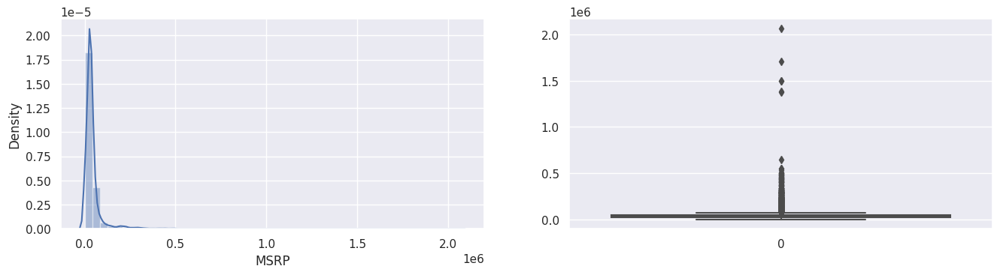

After: 



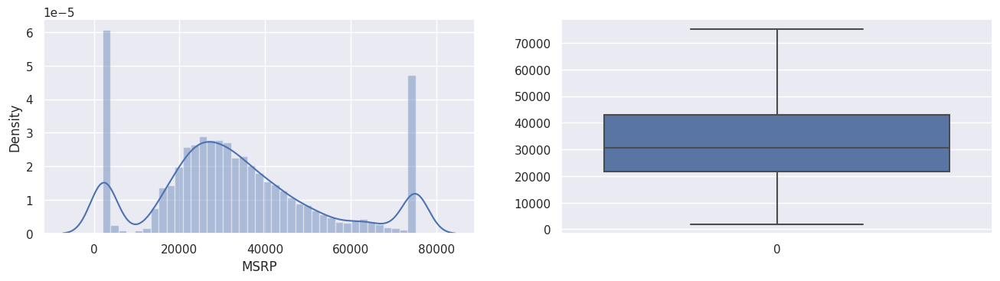

In [22]:
print('Before: \n')
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
sb.distplot(car_data['MSRP'])  # histogragh

plt.subplot(2,2,2)
sb.boxplot(car_data['MSRP'])    #boxplot
plt.show()

print('After: \n')
plt.figure(figsize=(16,8))
plt.subplot(2,2,3)
sb.distplot(cleaned_car_data['MSRP'])

plt.subplot(2,2,4)
sb.boxplot(cleaned_car_data['MSRP'])
plt.show()


In [23]:
# Rename and restructure irregularity in column and row
def rename_column(data):
    """replace space with underscore and titled case to a lower case
    and the values in object column"""
    data.columns = data.columns.str.replace(' ', '_').str.lower()

    value_case = list(data.dtypes[data.dtypes == 'object'].index)
    for column in value_case:
        data[column] = data[column].str.lower().str.replace(' ', '_')


rename_column(cleaned_car_data)


In [24]:
cleaned_car_data.head()


,make,model,year,engine_fuel_type,engine_hp,engine_cylinders,transmission_type,driven_wheels,number_of_doors,vehicle_size,vehicle_style,highway_mpg,city_mpg,popularity,msrp
0,bmw,1_series_m,2011,premium_unleaded_(required),335.0,6.0,manual,rear_wheel_drive,2.0,compact,coupe,26,19,3916,46135.0
1,bmw,1_series,2011,premium_unleaded_(required),300.0,6.0,manual,rear_wheel_drive,2.0,compact,convertible,28,19,3916,40650.0
2,bmw,1_series,2011,premium_unleaded_(required),300.0,6.0,manual,rear_wheel_drive,2.0,compact,coupe,28,20,3916,36350.0
3,bmw,1_series,2011,premium_unleaded_(required),230.0,6.0,manual,rear_wheel_drive,2.0,compact,coupe,28,18,3916,29450.0
4,bmw,1_series,2011,premium_unleaded_(required),230.0,6.0,manual,rear_wheel_drive,2.0,compact,convertible,28,18,3916,34500.0


In [25]:
# Univariate Analysis
def value_count(data, category_col):
    """function to print number of unique values in category column and visualise the top 5 count"""
    if data[category_col].dtype == 'object':
        number_of_makers = data[category_col].nunique()
        print(f'Number of unique car {category_col} availabe in the dataset is: {number_of_makers}')

    framed_data = data[category_col].value_counts().to_frame().reset_index()[:5]
    fig = px.bar(framed_data,
                 x = framed_data.iloc[:,0],
                 y = framed_data.iloc[:,1],
                 title = category_col,
                 height = 600,
                 width = 800,
                 color_discrete_sequence = ['darkgreen'],
                 labels = {'x': category_col,
                           'y': (f'count of {category_col}')}
                )
    fig.show()

value_count(cleaned_car_data, 'make')


Number of unique car make availabe in the dataset is: 48


In [26]:
value_count(cleaned_car_data, 'model')


Number of unique car model availabe in the dataset is: 914


In [27]:
value_count(cleaned_car_data, 'engine_fuel_type')


Number of unique car engine_fuel_type availabe in the dataset is: 10


In [28]:
value_count(cleaned_car_data, 'transmission_type')


Number of unique car transmission_type availabe in the dataset is: 5


In [29]:
value_count(cleaned_car_data, 'driven_wheels')


Number of unique car driven_wheels availabe in the dataset is: 4


In [30]:
value_count(cleaned_car_data, 'vehicle_size')


Number of unique car vehicle_size availabe in the dataset is: 3


In [31]:
value_count(cleaned_car_data, 'vehicle_style')


Number of unique car vehicle_style availabe in the dataset is: 16


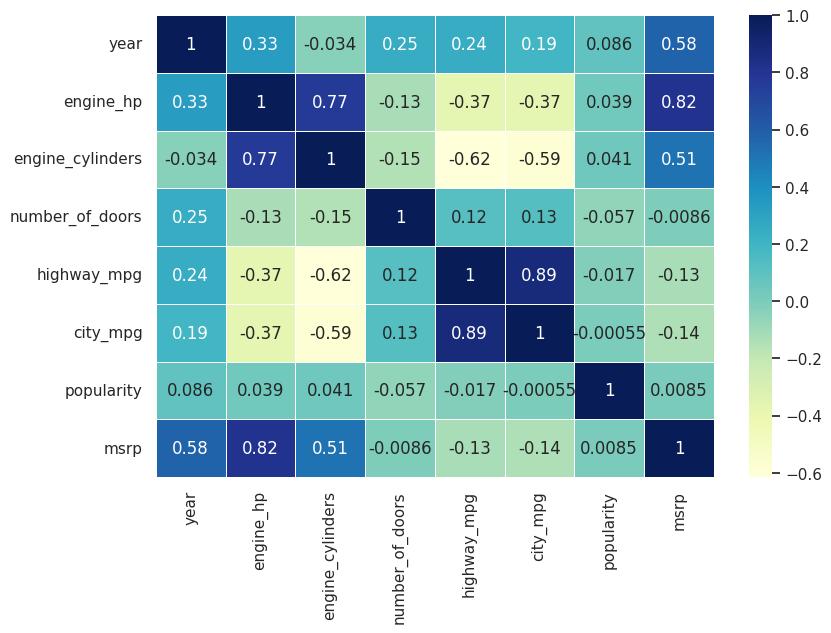

In [32]:
# Bivariate Analysis
# plot correlation matrix
f, ax = plt.subplots(figsize = (9, 6))
sb.heatmap(cleaned_car_data.corr(),
            annot = True,
            linewidths =.5,
            cmap ='YlGnBu',
            ax = ax);


In [33]:
cleaned_car_data.groupby(['make']).msrp.mean().reset_index().sort_values(by = 'msrp',ascending = False)[:10]


,make,msrp
12,ferrari,75182.000000
30,mclaren,75182.000000
2,aston_martin,75182.000000
22,lamborghini,75182.000000
4,bentley,75182.000000
6,bugatti,75182.000000
41,spyker,75182.000000
38,rolls-royce,75182.000000
28,maybach,75182.000000
27,maserati,74877.854545


In [34]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x = cleaned_car_data['make'].unique(),
    y = cleaned_car_data.groupby('make').mean()['popularity'].sort_values(ascending = False)[:10],
    marker_color = 'darkgreen'
))

fig.update_layout(title_text = 'Top 10 popular car brands',
                  xaxis_title = "car brand",
                  yaxis_title = "popularity")
fig.show()


In [35]:
mean_price_of_car_per_year = cleaned_car_data.groupby('year').mean()['msrp']
count_of_cars_per_year = cleaned_car_data.groupby('year').count()['msrp']

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(
        x = mean_price_of_car_per_year.index,
        y = mean_price_of_car_per_year,
        name='mean of cars per year',
        marker_color = 'darkgreen'),
    secondary_y=True,
)

fig.add_trace(go.Bar
              (x = count_of_cars_per_year.index,
               y = count_of_cars_per_year,
               name='count of cars per year',
               marker_color = 'darkgreen')
             )

# Set x-axis title
fig.update_xaxes(title_text = 'year')

# Set y-axes titles
fig.update_yaxes(title_text = "<b>Count</b> cars", secondary_y = False)
fig.update_yaxes(title_text = "<b>Mean MSRP</b> (in USD)", secondary_y = True)

# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode = 'group',
                  xaxis_tickangle = -45,
                  title_text = 'Yearly car count and mean price')

fig.show()

In [36]:
# Modelling
def preprocessing(data, column):
    """one-hot encoding, spliting and scaling of input"""
    data = data.copy()


    # one-hot encoding
    data = pd.get_dummies(data, drop_first = True)

    # split data into train and test set
    dep = data[column]       # dep = dependent
    indep = data.drop(column, axis=1)     # indep = independent

    # train-test split
    from sklearn.model_selection import train_test_split
    indep_train, indep_test, dep_train, dep_test = train_test_split(indep, dep, random_state = 1,
                                                                                shuffle = True,
                                                                                test_size = 0.2)

    # scale input
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    indep_train = pd.DataFrame(scaler.fit_transform(indep_train), columns = indep_train.columns)
    indep_test = pd.DataFrame(scaler.fit_transform(indep_test), columns = indep_test.columns)

    return indep_train, indep_test, dep_train, dep_test

indep_train, indep_test, dep_train, dep_test = preprocessing(cleaned_car_data, 'msrp')


In [37]:
indep_train.head()


,year,engine_hp,engine_cylinders,number_of_doors,highway_mpg,city_mpg,popularity,make_alfa_romeo,make_aston_martin,make_audi,make_bentley,make_bmw,make_bugatti,make_buick,make_cadillac,make_chevrolet,make_chrysler,make_dodge,make_ferrari,make_fiat,make_ford,make_genesis,make_gmc,make_honda,make_hummer,make_hyundai,make_infiniti,make_kia,make_lamborghini,make_land_rover,make_lexus,make_lincoln,make_lotus,make_maserati,make_maybach,make_mazda,make_mclaren,make_mercedes-benz,make_mitsubishi,make_nissan,make_oldsmobile,make_plymouth,make_pontiac,make_porsche,make_rolls-royce,make_saab,make_scion,make_spyker,make_subaru,make_suzuki,make_tesla,make_toyota,make_volkswagen,make_volvo,model_124_spider,model_190-class,model_1_series,model_1_series_m,model_2,model_200,model_200sx,model_240,model_240sx,model_2_series,model_3,model_300,model_300-class,model_3000gt,model_300m,model_300zx,model_323,model_350-class,model_350z,model_360,model_370z,model_3_series,model_3_series_gran_turismo,model_400-class,model_420-class,model_456m,model_458_italia,model_4_series,model_4_series_gran_coupe,model_4c,model_4runner,model_5,model_500,model_500-class,model_500e,model_500l,model_500x,model_550,model_560-class,model_57,model_570s,model_575m,model_599,model_5_series,model_5_series_gran_turismo,model_6,model_600-class,model_6000,model_612_scaglietti,model_62,model_626,model_650s_coupe,model_650s_spider,model_6_series,model_6_series_gran_coupe,model_718_cayman,model_740,model_760,model_780,model_7_series,model_80,model_850,model_86,model_8_series,model_9-2x,model_9-3,model_9-3_griffin,model_9-4x,model_9-5,model_9-7x,model_90,model_900,model_9000,model_911,model_928,model_929,model_940,model_944,model_960,model_968,model_a3,model_a4,model_a4_allroad,model_a5,model_a6,model_a7,model_a8,model_acadia,model_acadia_limited,model_accent,model_acclaim,model_accord,model_accord_crosstour,model_accord_hybrid,model_accord_plug-in_hybrid,model_achieva,model_activehybrid_5,model_activehybrid_7,model_activehybrid_x6,model_aerio,model_aerostar,model_alero,model_allante,model_allroad,model_allroad_quattro,model_alpina,model_alpina_b6_gran_coupe,model_alpina_b7,model_altima,model_altima_hybrid,model_amanti,model_amg_gt,model_armada,model_arnage,model_aspen,model_aspire,model_astro,model_astro_cargo,model_ats,model_ats-v,model_ats_coupe,model_aurora,model_avalanche,model_avalon,model_avalon_hybrid,model_avenger,model_aventador,model_aveo,model_aviator,model_axxess,model_azera,model_aztek,model_azure,model_azure_t,model_b-class_electric_drive,model_b-series,model_b-series_pickup,model_b-series_truck,model_b9_tribeca,model_baja,model_beetle,model_beetle_convertible,model_beretta,model_black_diamond_avalanche,model_blackwood,model_blazer,model_bolt_ev,model_bonneville,model_borrego,model_boxster,model_bravada,model_breeze,model_bronco,model_bronco_ii,model_brooklands,model_brougham,model_brz,model_c-class,model_c-max_hybrid,model_c/k_1500_series,model_c/k_2500_series,model_c30,model_c36_amg,model_c43_amg,model_c70,model_c8,model_cabrio,model_cabriolet,model_cadenza,model_caliber,model_california,model_california_t,model_camaro,model_camry,model_camry_hybrid,model_camry_solara,model_canyon,model_caprice,model_captiva_sport,model_caravan,model_carrera_gt,model_cascada,model_catera,model_cavalier,model_cayenne,model_cayman,model_cayman_s,model_cc,model_celebrity,model_celica,model_century,model_challenger,model_charger,model_chevy_van,model_ciera,model_cirrus,model_city_express,model_civic,model_civic_crx,model_civic_del_sol,model_cl,model_cl-class,model_cla-class,model_classic,model_clk-class,model_cls-class,model_cobalt,model_colorado,model_colt,model_concorde,model_continental,model_continental_flying_spur,model_continental_flying_spur_speed,model_continental_gt,model_continental_gt3-r,model_continental_gt_speed,model_continental_gt_speed_convertible,model_continental_gtc,model_continental_gtc_speed,model_continental_supersports,model_continental_supersports_convertible,mode

In [38]:
# Dimensionality reduction
from sklearn.decomposition import PCA
n_components = 100
pca = PCA(n_components = n_components)
pca.fit(indep_train)

ind_train_pca = pd.DataFrame(pca.fit_transform(indep_train), columns=["PC" + str(i) for i in range(1, n_components + 1)])
ind_test_pca = pd.DataFrame(pca.fit_transform(indep_test),  columns=["PC" + str(i) for i in range(1, n_components + 1)])


In [39]:
ind_train_pca.head()


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89,PC90,PC91,PC92,PC93,PC94,PC95,PC96,PC97,PC98,PC99,PC100
0,-2.234092,-1.979105,0.530644,3.119024,1.876519,-0.911059,1.214326,-1.150805,-0.009973,-0.059543,-0.151536,-0.639957,0.420861,-1.315160,2.642116,-0.301975,-0.163806,0.221572,-1.019018,-1.382451,0.176333,-0.058626,0.015826,-0.163879,-0.164682,0.189545,0.217880,-0.032598,0.102064,-0.261661,0.255728,-0.139334,0.091745,0.092554,0.086734,-0.067506,0.078416,0.048243,0.083345,0.079201,-0.228752,0.108997,0.126914,0.118216,-0.399828,0.259618,-0.455308,-0.224471,-0.024139,-0.221405,-0.840437,0.500903,0.409074,-0.166037,0.602159,-0.233174,-0.171812,-0.024862,-0.289857,-0.326403,0.636642,0.241124,-0.215037,-0.193959,0.371992,1.034757,-0.895028,0.306231,0.537026,0.163149,0.685532,-0.180633,0.292777,-0.304300,0.245402,-0.175575,0.008510,-0.301464,-0.134232,-0.458649,0.257063,-0.073584,-1.123587,0.283980,-0.102334,0.067194,0.025350,0.050676,-0.011556,0.183237,-0.032910,-0.174100,0.058166,-0.224525,-0.102068,0.054689,-0.093034,0.000267,0.033325,-0.188993
1,-1.255891,-1.515377,-0.772963,1.724681,0.823114,0.721754,-0.107559,-0.400525,-0.637726,-1.113015,0.755053,1.567474,-0.582637,0.687520,-1.107293,-0.523853,3.473428,0.855165,-1.024711,-0.530126,0.344944,0.796028,-1.773744,-0.087863,-0.270634,0.141160,-0.320341,0.553342,-0.432614,0.356402,-0.433902,0.038478,0.220513,0.012213,0.138457,0.318447,-0.464760,0.288581,0.359408,-0.212846,0.212089,-0.424959,-0.136827,-0.977132,0.117997,-0.022367,-1.546772,1.679667,-1.652063,2.851167,0.503757,-0.909289,0.804776,-0.406121,2.332658,-0.394109,1.458294,-1.902227,-1.018190,-0.525932,-0.216002,0.634378,0.705354,0.673004,-1.563094,0.664526,0.207224,-0.175242,0.532208,0.745320,-0.397275,-0.228726,-0.659193,-0.783156,0.685365,-0.121237,0.479601,-0.320546,0.479527,0.692555,-0.360444,-0.068776,0.069015,1.107347,-0.067420,0.213889,1.031292,0.343703,-0.342370,-0.581964,-0.521045,0.291865,-0.469677,0.294838,0.163723,-0.399786,0.134825,0.535081,-0.415496,-0.505180
2,-0.466504,-0.405536,-2.387903,1.016735,2.053007,-0.104408,-0.578369,-0.554334,-1.371097,-0.410130,-0.572357,-0.861062,0.310498,0.177164,-0.907381,-0.591605,-0.336887,1.542821,1.635215,-0.994638,-0.946749,1.369021,0.893085,-5.938787,-1.834119,-0.874330,-0.316155,3.326087,-0.392409,0.737663,3.712459,0.194213,-2.742893,-1.839228,-0.230913,1.507970,-1.106548,-0.144632,-0.033941,2.399706,-0.331637,0.787610,-1.650719,0.076643,-0.154551,-0.934759,0.041329,0.035729,-0.284127,-0.212250,0.758615,1.015192,2.716442,-1.535434,1.058173,-0.637365,-0.750091,-1.480682,-0.987292,-0.353975,0.783975,2.630199,-0.235489,-0.042163,-1.214940,1.226142,0.536697,1.652503,1.783553,0.371787,-0.030951,1.397850,-0.668679,-1.751976,0.544417,-0.642063,-0.240074,-1.821394,-0.505684,-0.652376,0.881315,-0.051831,-0.085681,-0.146342,1.347549,0.881854,0.937819,-0.108357,-0.567767,-0.573534,-1.177943,1.208356,-0.031830,1.750878,0.184656,-0.759631,-0.485513,-0.742710,-0.369807,1.174577
3,-2.072377,4.209609,-0.730993,-2.057313,0.667814,0.226964,0.042294,2.086049,-1.708143,0.747191,-0.610750,0.896842,0.750675,-1.248645,0.421418,-1.947701,-0.107537,2.042968,0.801762,-0.212418,1.230179,0.141487,-0.811666,1.399066,0.167292,-0.593137,-1.639995,0.205582,2.188764,0.578534,0.840307,0.406038,0.491241,-1.797597,-0.235398,0.361524,-1.103531,-1.633362,-1.121983,0.369579,0.108427,-0.206138,0.611911,-0.781194,0.956495,-1.560039,0.215754,-0.414858,-0.179079,-1.380171,-0.297500,-1.492921,0.055950,0.889163,1.389562,2.172935,-0.511315,-0.150682,0.286187,0.537397,-0.629340,-2.626063,2.488350,-0.622659,-0.628704,1.420115,-0.231277,

In [40]:
# Hyper parameter tuning
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 100, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 50, num = 10)]
# max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [1, 2, 3, 4, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [3, 5, 7, 15]

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

print(random_grid)


{'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 14, 18, 23, 27, 32, 36, 41, 45, 50], 'min_samples_split': [1, 2, 3, 4, 10], 'min_samples_leaf': [3, 5, 7, 15]}


In [41]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
rf = RandomForestRegressor()

In [42]:
rf_random = RandomizedSearchCV(estimator = rf,
                               param_distributions = random_grid,
                               scoring ='neg_mean_squared_error',
                               n_iter = 2,
                               cv = 3,
                               verbose=2,
                               random_state = 5,
                               n_jobs = 1)


In [43]:
rf_random.fit(ind_train_pca, dep_train)

Fitting 3 folds for each of 2 candidates, totalling 6 fits
[CV] END max_depth=41, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=60; total time=  24.2s
[CV] END max_depth=41, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=60; total time=  23.8s
[CV] END max_depth=41, max_features=auto, min_samples_leaf=7, min_samples_split=2, n_estimators=60; total time=  24.2s
[CV] END max_depth=32, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=50; total time=   0.0s
[CV] END max_depth=32, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=50; total time=   0.0s
[CV] END max_depth=32, max_features=sqrt, min_samples_leaf=5, min_samples_split=1, n_estimators=50; total time=   0.0s


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_iter=2, n_jobs=1,
                   param_distributions={'max_depth': [10, 14, 18, 23, 27, 32,
                                                      36, 41, 45, 50],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [3, 5, 7, 15],
                                        'min_samples_split': [1, 2, 3, 4, 10],
                                        'n_estimators': [10, 20, 30, 40, 50, 60,
                                                         70, 80, 90, 100]},
                   random_state=5, scoring='neg_mean_squared_error', verbose=2)